In [19]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/emotion-detection-from-text/tweet_emotions.csv


In [20]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt


In [21]:
data = pd.read_csv("/kaggle/input/emotion-detection-from-text/tweet_emotions.csv")


In [22]:
data.head()

,tweet_id,sentiment,content
0,1956967341,empty,@tiffanylue i know i was listenin to bad habi...
1,1956967666,sadness,Layin n bed with a headache ughhhh...waitin o...
2,1956967696,sadness,Funeral ceremony...gloomy friday...
3,1956967789,enthusiasm,wants to hang out with friends SOON!
4,1956968416,neutral,@dannycastillo We want to trade with someone w...


In [23]:
data.shape

(40000, 3)

In [24]:
data['sentiment'].value_counts()

sentiment
neutral       8638
worry         8459
happiness     5209
sadness       5165
love          3842
surprise      2187
fun           1776
relief        1526
hate          1323
empty          827
enthusiasm     759
boredom        179
anger          110
Name: count, dtype: int64

In [25]:
data['sentiment'].nunique()

13

In [26]:
data.loc[600:700]

,tweet_id,sentiment,content
600,1957106328,sadness,#jonaswebcast i just missed it!!!!
601,1957106609,hate,Dang it! I REALLY look like crap!! Sigh only h...
602,1957106752,neutral,waiting to get picked up!
603,1957106916,sadness,So exhausted..can't sleep. I don't like these ...
604,1957107095,sadness,i'm gonna miss all the live Comet action tomor...
...,...,...,...
696,1957127234,love,Hahaha! Alright ..
697,1957127251,hate,@guitar21g @jackie_hussein i have to wake up e...
698,1957128448,happiness,someone take me to LA I NEED TO SEE THE LEMON...
699,1957128473,sadness,um... so I don't think my text msgs have a &qu...


In [27]:
data.drop(columns=['tweet_id'],inplace=True)

In [28]:
data.head(10)

,sentiment,content
0,empty,@tiffanylue i know i was listenin to bad habi...
1,sadness,Layin n bed with a headache ughhhh...waitin o...
2,sadness,Funeral ceremony...gloomy friday...
3,enthusiasm,wants to hang out with friends SOON!
4,neutral,@dannycastillo We want to trade with someone w...
5,worry,Re-pinging @ghostridah14: why didn't you go to...
6,sadness,"I should be sleep, but im not! thinking about ..."
7,worry,Hmmm. http://www.djhero.com/ is down
8,sadness,@charviray Charlene my love. I miss you
9,sadness,@kelcouch I'm sorry at least it's Friday?


In [29]:
data['content'][0]

'@tiffanylue i know  i was listenin to bad habit earlier and i started freakin at his part =['

In [30]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   sentiment  40000 non-null  object
 1   content    40000 non-null  object
dtypes: object(2)
memory usage: 625.1+ KB


In [31]:
#dropping empty,enthusiasm,boredom ,anger due to imbalanced data

# List of values to drop
values_to_drop = ['empty','enthusiasm','anger','boredom']

# Filter and drop the specified values from the "Emotion" column
data = data[~data['sentiment'].isin(values_to_drop)]


In [32]:
data.head()

,sentiment,content
1,sadness,Layin n bed with a headache ughhhh...waitin o...
2,sadness,Funeral ceremony...gloomy friday...
4,neutral,@dannycastillo We want to trade with someone w...
5,worry,Re-pinging @ghostridah14: why didn't you go to...
6,sadness,"I should be sleep, but im not! thinking about ..."


In [33]:
data['sentiment'].value_counts()

sentiment
neutral      8638
worry        8459
happiness    5209
sadness      5165
love         3842
surprise     2187
fun          1776
relief       1526
hate         1323
Name: count, dtype: int64

In [34]:
data['content'][4]

'@dannycastillo We want to trade with someone who has Houston tickets, but no one will.'

In [35]:

neutral_msg_text = data[data.sentiment == 'neutral'].content
worry_msg_text = data[data.sentiment == 'worry'].content
happiness_msg_text = data[data.sentiment == 'happiness'].content
sadness_msg_text = data[data.sentiment == 'sadness'].content
love_msg_text = data[data.sentiment == 'love'].content
surprise_msg_text = data[data.sentiment == 'surprise'].content
fun_msg_text = data[data.sentiment == 'fun'].content
relief_msg_text = data[data.sentiment == 'relief'].content
hate_msg_text = data[data.sentiment == 'hate'].content


In [36]:
!pip install wordcloud

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 461.3/461.3 kB 8.5 MB/s eta 0:00:00a 0:00:01

[notice] A new release of pip is available: 23.0.1 -> 23.3.1
[notice] To update, run: pip install --upgrade pip


In [37]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
%matplotlib inline

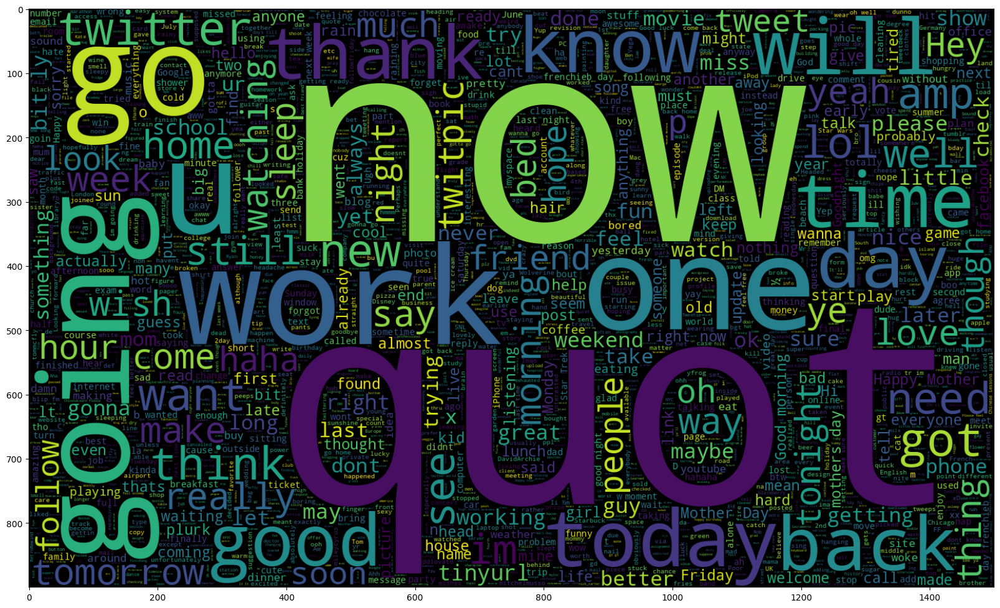

In [38]:
#neutral wordcloud
plt.figure(figsize = (20, 22))

wc = WordCloud(width = 1500, height = 900, max_words = 2500).generate(" ".join(neutral_msg_text))
plt.imshow(wc, interpolation='bilinear')

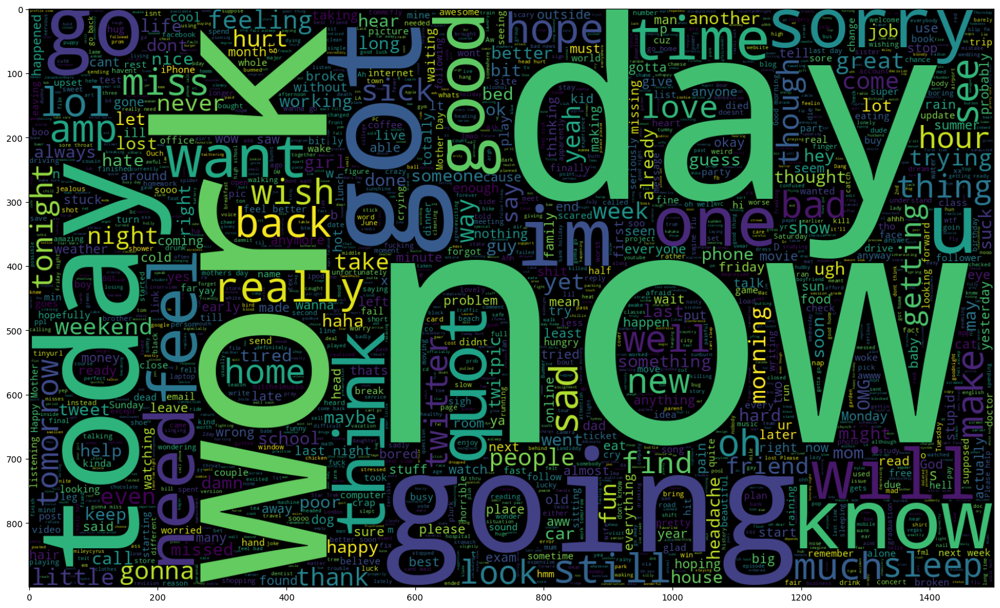

In [39]:
#worry msg wordcloud
plt.figure(figsize = (20, 22))

wc = WordCloud(width = 1500, height = 900, max_words = 2500).generate(" ".join(worry_msg_text))
plt.imshow(wc, interpolation='bilinear')

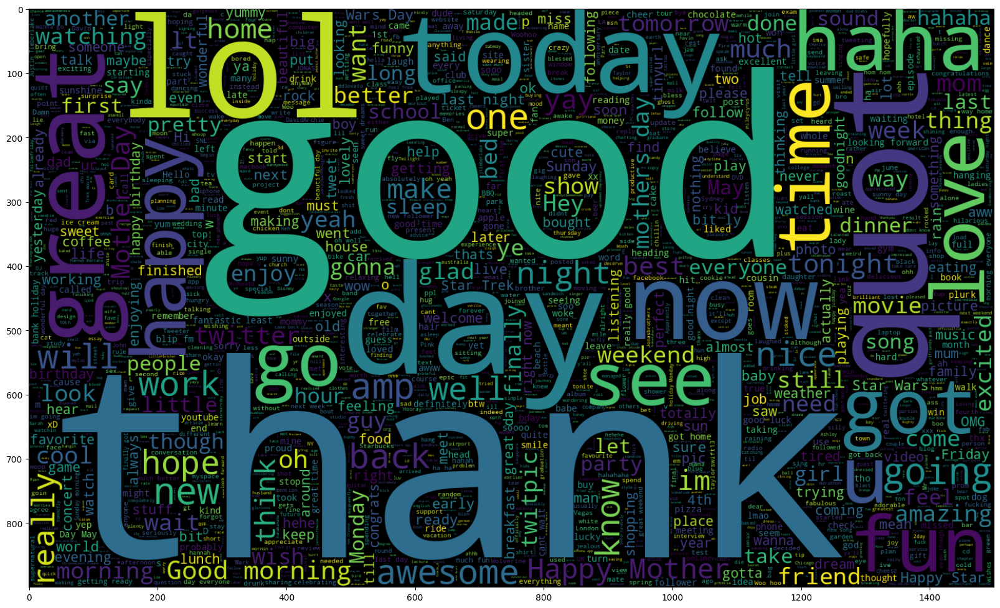

In [40]:
#happyness msg wordcloud
plt.figure(figsize = (20, 22))

wc = WordCloud(width = 1500, height = 900, max_words = 2500).generate(" ".join(happiness_msg_text))
plt.imshow(wc, interpolation='bilinear')

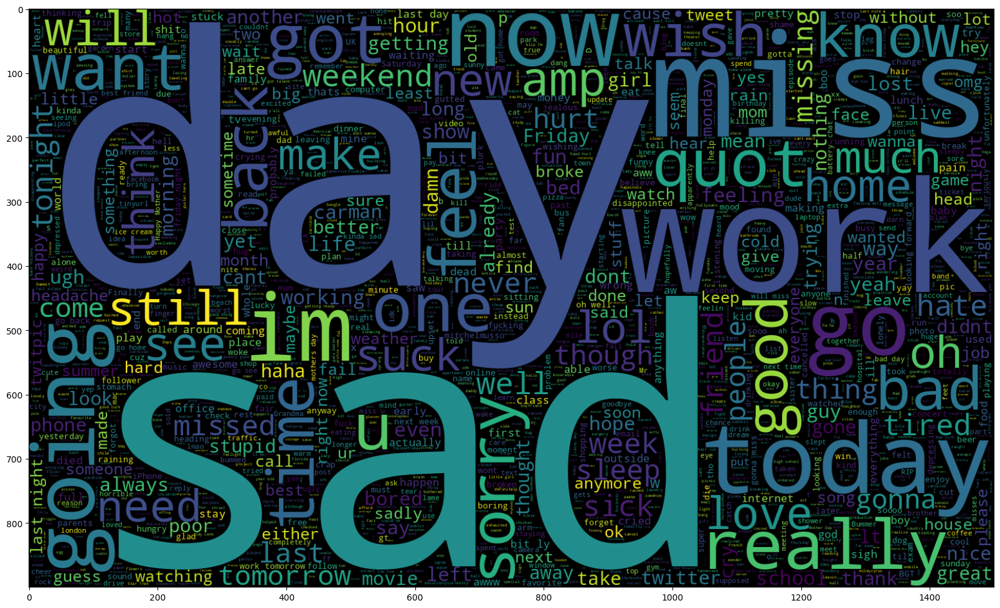

In [41]:
#sadness msg wordcloud
plt.figure(figsize = (20, 22))

wc = WordCloud(width = 1500, height = 900, max_words = 2500).generate(" ".join(sadness_msg_text))
plt.imshow(wc, interpolation='bilinear')

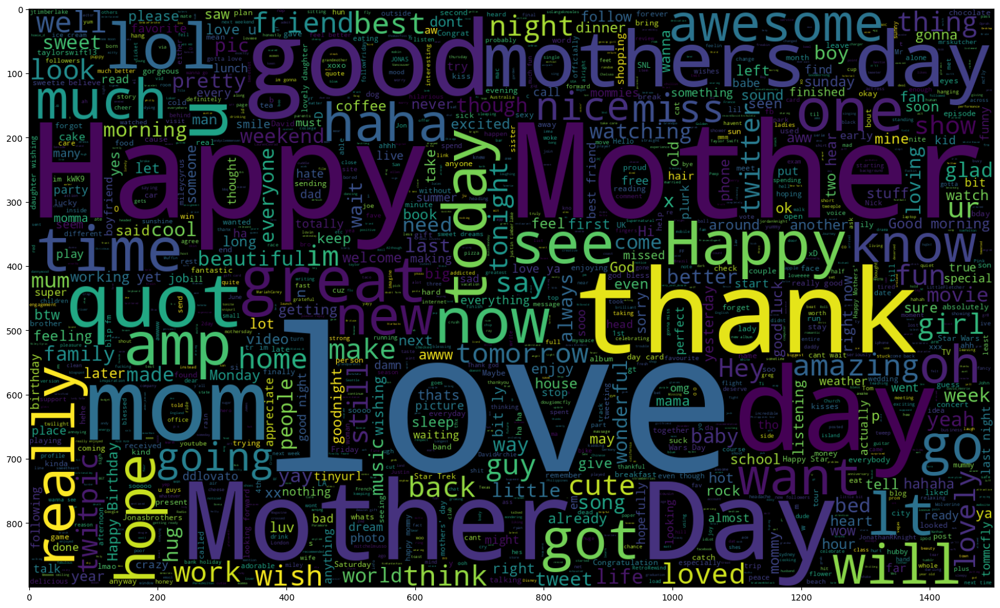

In [42]:
#love msg wordcloud
plt.figure(figsize = (20, 22))

wc = WordCloud(width = 1500, height = 900, max_words = 2500).generate(" ".join(love_msg_text))
plt.imshow(wc, interpolation='bilinear')

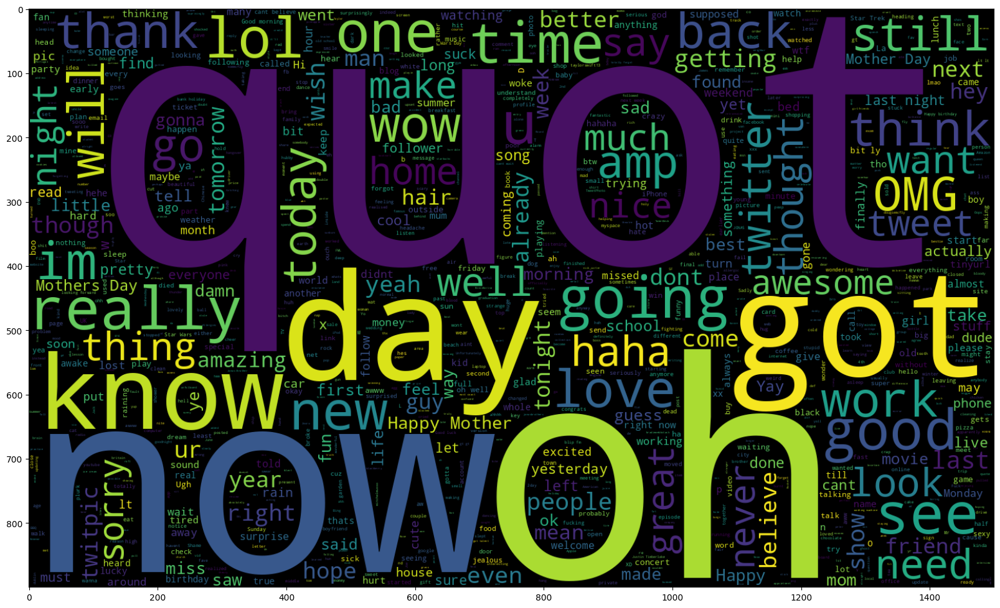

In [43]:
#suprise msg wordcloud
plt.figure(figsize = (20, 22))

wc = WordCloud(width = 1500, height = 900, max_words = 2500).generate(" ".join(surprise_msg_text))
plt.imshow(wc, interpolation='bilinear')

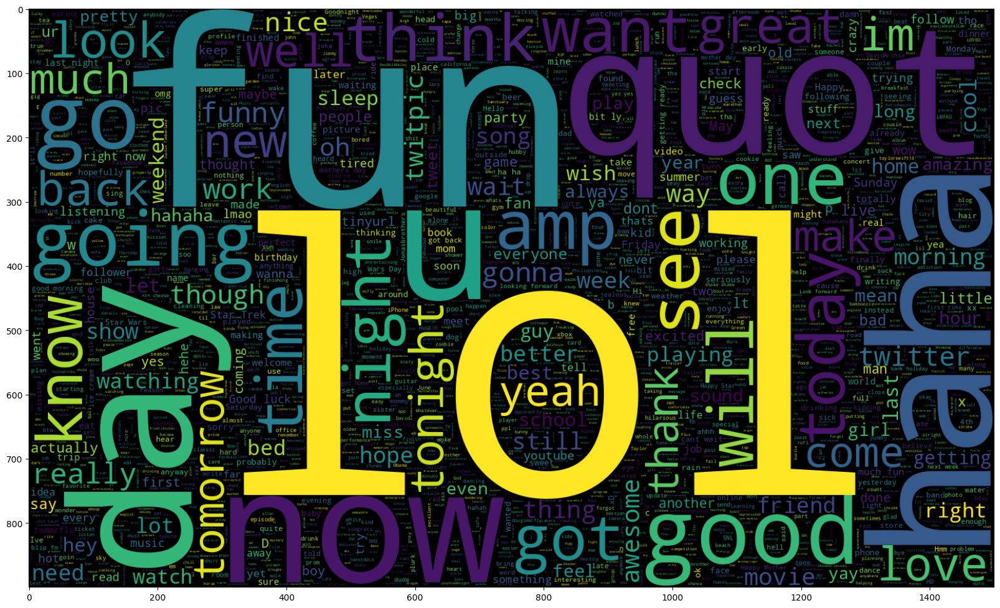

In [44]:
#fun msg wordcloud
plt.figure(figsize = (20, 22))

wc = WordCloud(width = 1500, height = 900, max_words = 2500).generate(" ".join(fun_msg_text))
plt.imshow(wc, interpolation='bilinear')

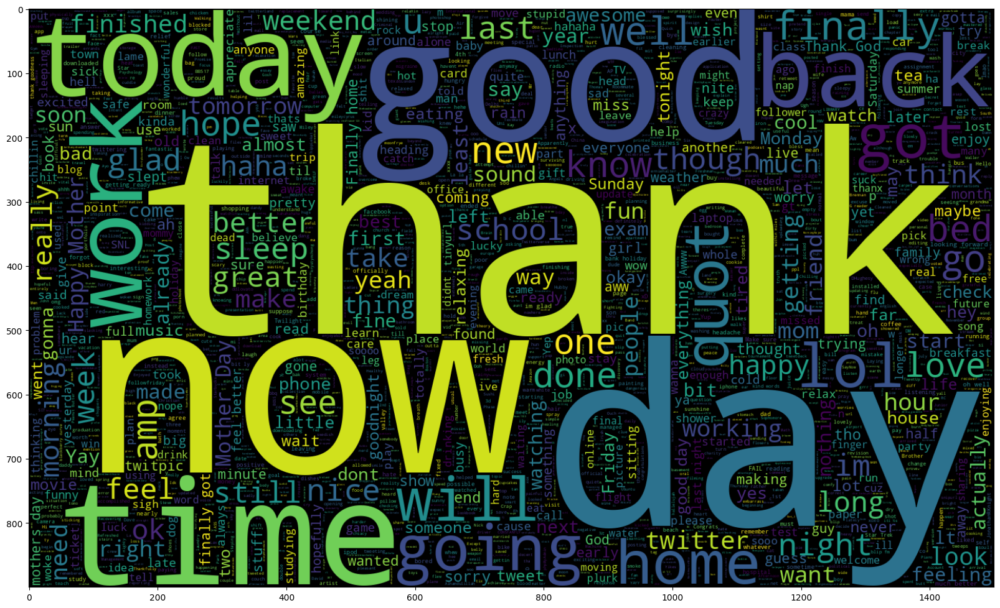

In [45]:
#relief msg wordcloud
plt.figure(figsize = (20, 22))

wc = WordCloud(width = 1500, height = 900, max_words = 2500).generate(" ".join(relief_msg_text))
plt.imshow(wc, interpolation='bilinear')

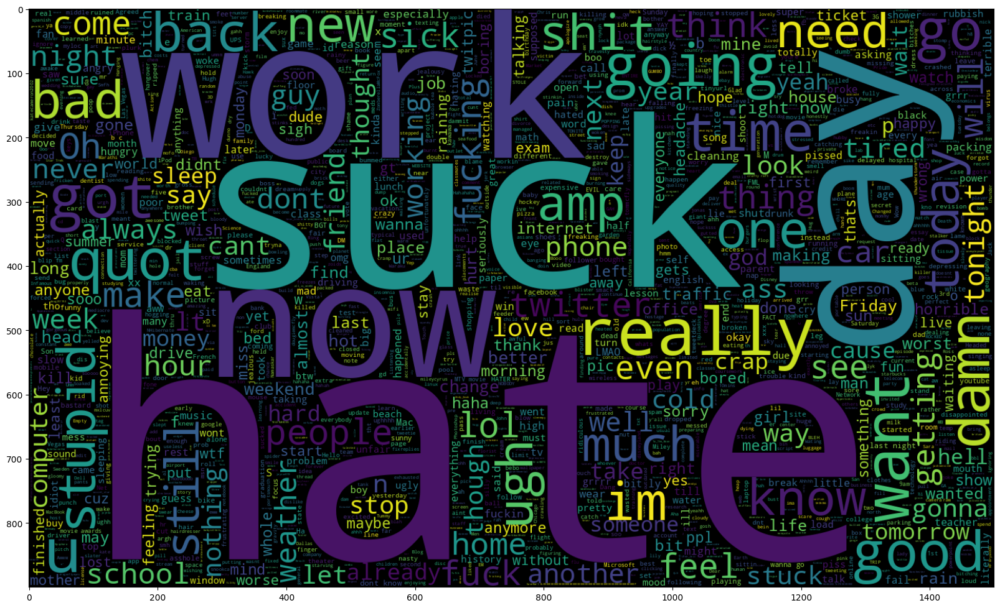

In [46]:
#hate msg wordcloud
plt.figure(figsize = (20, 22))

wc = WordCloud(width = 1500, height = 900, max_words = 2500).generate(" ".join(hate_msg_text))
plt.imshow(wc, interpolation='bilinear')

In [47]:
data['sentiment'].unique()

array(['sadness', 'neutral', 'worry', 'surprise', 'love', 'fun', 'hate',
       'happiness', 'relief'], dtype=object)

([<matplotlib.patches.Wedge at 0x7d5ec20aefd0>,
 [Text(0.908630948248979, 0.7838302111325904, 'sadness'),
  Text(-0.6270509550046537, 1.023135914640744, 'neutral'),
  Text(-1.193351991892345, -0.12613890536457464, 'worry'),
  Text(-0.6880734595353714, -0.9831352471979762, 'surprise'),
  Text(0.1574116253474665, -1.189630858798421, 'love'),
  Text(0.7053823276613089, -0.9707913121897589, 'fun'),
  Text(0.9795214477483883, -0.6932082900549454, 'hate'),
  Text(1.1297836476826333, -0.40446125825463614, 'happiness'),
  Text(1.1928760546044794, -0.13056308188477928, 'relief')],
 [Text(0.5300347198119044, 0.45723428982734443, '22.7%'),
  Text(-0.3657797237527146, 0.596829283540434, '22.2%'),
  Text(-0.6961219952705344, -0.0735810281293352, '13.7%'),
  Text(-0.40137618472896663, -0.573495560865486, '13.5%'),
  Text(0.09182344811935546, -0.693951334299079, '10.1%'),
  Text(0.41147302446909684, -0.5662949321106926, '5.7%'),
  Text(0.5713875111865598, -0.4043715025320515, '4.7%'),
  Text(0.659040

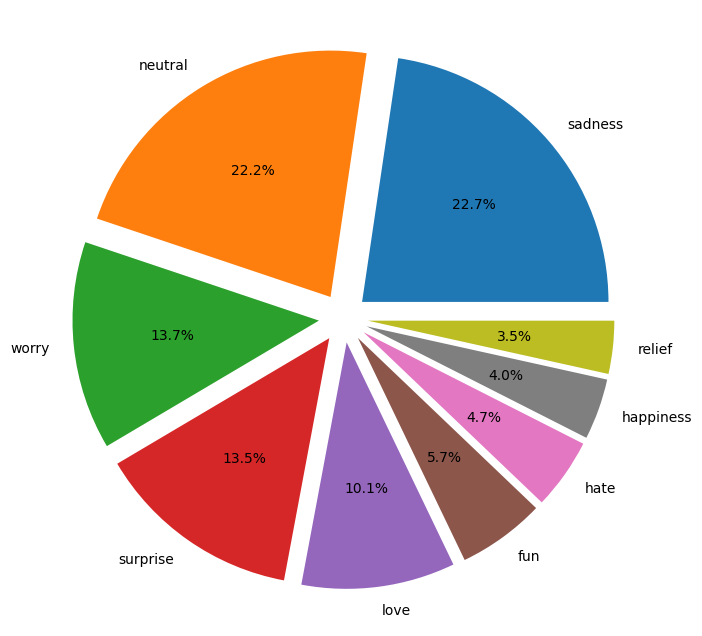

In [48]:
# Class Distribution

plt.figure(figsize=(11, 8))
labels = ['sadness', 'neutral', 'worry', 'surprise', 'love', 'fun', 'hate',
       'happiness', 'relief']
explode = [.1, .1,.1,.1,.1,.1,.1,.1,.1]

sizes = data['sentiment'].value_counts().values

plt.pie(x = sizes, explode = explode, labels = labels, autopct = "%1.1f%%")

In [49]:
# Get length column for each text

data['text_length'] = data['content'].apply(len)

In [50]:
data.head()

,sentiment,content,text_length
1,sadness,Layin n bed with a headache ughhhh...waitin o...,60
2,sadness,Funeral ceremony...gloomy friday...,35
4,neutral,@dannycastillo We want to trade with someone w...,86
5,worry,Re-pinging @ghostridah14: why didn't you go to...,84
6,sadness,"I should be sleep, but im not! thinking about ...",132


In [51]:
data['text_length'].describe()

count    38125.000000
mean        73.552839
std         36.557146
min          1.000000
25%         43.000000
50%         69.000000
75%        103.000000
max        167.000000
Name: text_length, dtype: float64

## the total length of text is
### average = 73
### max = 167
### median = 69

In [52]:
data['Classify']= data['sentiment'].map({'sadness':0, 'neutral':1, 'worry':2, 'surprise':3, 'love':4, 'fun':5, 'hate':6,
       'happiness':7, 'relief':8})

In [53]:
data.head()

,sentiment,content,text_length,Classify
1,sadness,Layin n bed with a headache ughhhh...waitin o...,60,0
2,sadness,Funeral ceremony...gloomy friday...,35,0
4,neutral,@dannycastillo We want to trade with someone w...,86,1
5,worry,Re-pinging @ghostridah14: why didn't you go to...,84,2
6,sadness,"I should be sleep, but im not! thinking about ...",132,0


In [54]:
X = data['content']
y = data['Classify']

In [55]:
# Train test split
from sklearn.model_selection import train_test_split

In [56]:
# Train Test Split

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [57]:
x_train.shape

(30500,)

In [58]:
# Convert the messages into the numerical values

max_len = 100
vocab_size = 1000

In [59]:
# Text Pre-processing Modules

import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

D1107 08:28:11.290579325      15 config.cc:119]                        gRPC EXPERIMENT tcp_frame_size_tuning               OFF (default:OFF)
D1107 08:28:11.290606822      15 config.cc:119]                        gRPC EXPERIMENT tcp_rcv_lowat                       OFF (default:OFF)
D1107 08:28:11.290610301      15 config.cc:119]                        gRPC EXPERIMENT peer_state_based_framing            OFF (default:OFF)
D1107 08:28:11.290612854      15 config.cc:119]                        gRPC EXPERIMENT flow_control_fixes                  ON  (default:ON)
D1107 08:28:11.290615366      15 config.cc:119]                        gRPC EXPERIMENT memory_pressure_controller          OFF (default:OFF)
D1107 08:28:11.290618151      15 config.cc:119]                        gRPC EXPERIMENT unconstrained_max_quota_buffer_size OFF (default:OFF)
D1107 08:28:11.290620612      15 config.cc:119]                        gRPC EXPERIMENT new_hpack_huffman_decoder           ON  (default:ON)
D1107 08:28:11.

In [60]:
tokens = Tokenizer(num_words=500, oov_token='out of vacabulary')

tokens.fit_on_texts(x_train)

In [61]:
# Get the word index
word_index = tokens.word_index
total_words = len(word_index)
total_words

40477

In [62]:
word_index

{'out of vacabulary': 1,
 'i': 2,
 'to': 3,
 'the': 4,
 'a': 5,
 'my': 6,
 'and': 7,
 'you': 8,
 'it': 9,
 'is': 10,
 'in': 11,
 'for': 12,
 'of': 13,
 'on': 14,
 'me': 15,
 'so': 16,
 'that': 17,
 'have': 18,
 'but': 19,
 "i'm": 20,
 'just': 21,
 'day': 22,
 'with': 23,
 'be': 24,
 'at': 25,
 'was': 26,
 'not': 27,
 'all': 28,
 'good': 29,
 'this': 30,
 'now': 31,
 'out': 32,
 'up': 33,
 'get': 34,
 'like': 35,
 'are': 36,
 'no': 37,
 'quot': 38,
 'http': 39,
 'go': 40,
 'love': 41,
 "it's": 42,
 'your': 43,
 'do': 44,
 'today': 45,
 'too': 46,
 'got': 47,
 'work': 48,
 'going': 49,
 'happy': 50,
 'lol': 51,
 'from': 52,
 'one': 53,
 'time': 54,
 'u': 55,
 'back': 56,
 'know': 57,
 'what': 58,
 'com': 59,
 'im': 60,
 'will': 61,
 'about': 62,
 'am': 63,
 'really': 64,
 "don't": 65,
 'we': 66,
 'its': 67,
 'see': 68,
 'had': 69,
 'amp': 70,
 'there': 71,
 'can': 72,
 "can't": 73,
 'if': 74,
 'some': 75,
 'new': 76,
 'think': 77,
 'night': 78,
 'well': 79,
 'home': 80,
 'thanks': 81,
 '

In [63]:
#for train data
training_sequences = tokens.texts_to_sequences(x_train)
training_data = pad_sequences(training_sequences, maxlen=100, padding='post')

In [64]:
training_data

array([[ 51,  83,   2, ...,   0,   0,   0],
       [  1, 166,   9, ...,   0,   0,   0],
       [  1,   1,  67, ...,   0,   0,   0],
       ...,
       [176,  14,   5, ...,   0,   0,   0],
       [  1, 491,   1, ...,   0,   0,   0],
       [  1,   2,  21, ...,   0,   0,   0]], dtype=int32)

In [65]:
#for testdata
testing_sequences = tokens.texts_to_sequences(x_test)
testing_data = pad_sequences(testing_sequences, maxlen=100, padding='post')

In [66]:
testing_data

array([[  1,   1,  44, ...,   0,   0,   0],
       [  1,   1,   1, ...,   0,   0,   0],
       [  1, 430,  83, ...,   0,   0,   0],
       ...,
       [ 10, 246,  50, ...,   0,   0,   0],
       [  1,   1,   2, ...,   0,   0,   0],
       [  1,   1,   2, ...,   0,   0,   0]], dtype=int32)

In [67]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, Dropout, GlobalMaxPooling1D, Flatten

In [68]:
model = Sequential()
model.add(Embedding(vocab_size, 16, input_length = max_len))
model.add(GlobalMaxPooling1D())

model.add(Dense(24, activation = 'relu'))
model.add(Dropout(0.25))
model.add(Dense(14, activation = 'relu'))
model.add(Dropout(0.25))
model.add(Dense(1, activation = 'softmax'))

In [69]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 100, 16)           16000     
                                                                 
 global_max_pooling1d (Globa  (None, 16)               0         
 lMaxPooling1D)                                                  
                                                                 
 dense (Dense)               (None, 24)                408       
                                                                 
 dropout (Dropout)           (None, 24)                0         
                                                                 
 dense_1 (Dense)             (None, 14)                350       
                                                                 
 dropout_1 (Dropout)         (None, 14)                0         
                                                        

In [70]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics = ['accuracy'])

In [71]:
model.fit(training_data, y_train, epochs=10, validation_data=(testing_data, y_test))

Epoch 1/10


/usr/local/lib/python3.8/site-packages/tensorflow/python/util/dispatch.py:1176: SyntaxWarning: In loss categorical_crossentropy, expected y_pred.shape to be (batch_size, num_classes) with num_classes > 1. Received: y_pred.shape=(None, 1). Consider using 'binary_crossentropy' if you only have 2 classes.
  return dispatch_target(*args, **kwargs)


954/954 [==============================] - 3s 2ms/step - loss: 0.0000e+00 - accuracy: 0.2261 - val_loss: 0.0000e+00 - val_accuracy: 0.2286
Epoch 2/10
954/954 [==============================] - 2s 2ms/step - loss: 0.0000e+00 - accuracy: 0.2261 - val_loss: 0.0000e+00 - val_accuracy: 0.2286
Epoch 3/10
954/954 [==============================] - 2s 2ms/step - loss: 0.0000e+00 - accuracy: 0.2261 - val_loss: 0.0000e+00 - val_accuracy: 0.2286
Epoch 4/10
954/954 [==============================] - 2s 2ms/step - loss: 0.0000e+00 - accuracy: 0.2261 - val_loss: 0.0000e+00 - val_accuracy: 0.2286
Epoch 5/10
954/954 [==============================] - 2s 2ms/step - loss: 0.0000e+00 - accuracy: 0.2261 - val_loss: 0.0000e+00 - val_accuracy: 0.2286
Epoch 6/10
954/954 [==============================] - 2s 2ms/step - loss: 0.0000e+00 - accuracy: 0.2261 - val_loss: 0.0000e+00 - val_accuracy: 0.2286
Epoch 7/10
954/954 [==============================] - 2s 2ms/step - loss: 0.0000e+00 - accuracy: 0.2261 - val_l

In [72]:
from tensorflow.keras.layers import LSTM, SpatialDropout1D

In [73]:
model_L = Sequential()
model_L.add(Embedding(vocab_size, 16, input_length = max_len))
model_L.add(SpatialDropout1D(0.25))
#model_L.add(GlobalMaxPooling1D())

model_L.add(LSTM(128))
model_L.add(Dropout(0.3))
model_L.add(Dense(1, activation = 'softmax'))

In [74]:
model_L.compile(loss='categorical_crossentropy', optimizer='adam', metrics = ['accuracy'])

## due to low accuracy by applying lstm lets try ml algorithms and lets balance the data using smote 

In [76]:
X = data['content']
y = data['Classify']

In [77]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [78]:
tf = TfidfVectorizer(max_features=2500)

X = tf.fit_transform(data['content']).toarray()
y = data['Classify']

In [79]:
X = pd.DataFrame(X)
X

,0,1,2,3,4,5,6,7,8,9,...,2490,2491,2492,2493,2494,2495,2496,2497,2498,2499
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38120,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
38121,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
38122,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
38123,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [80]:
!pip install imblearn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.6/235.6 kB 4.5 MB/s eta 0:00:00a 0:00:01

[notice] A new release of pip is available: 23.0.1 -> 23.3.1
[notice] To update, run: pip install --upgrade pip


In [81]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state = 24)

In [82]:
X_sm, y_sm = sm.fit_resample(X, y)

In [83]:
## Data Splitting

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_sm, y_sm, test_size = 0.2, random_state = 32)

In [84]:
# Decision Tree

from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()

In [85]:
# Fit the data

dt.fit(X_train, y_train)

DecisionTreeClassifier()

In [87]:
# Make a prediction

y_pred = dt.predict(X_test)

In [88]:
y_pred

array([0, 1, 8, ..., 8, 4, 5])

In [116]:
print("F1 Score",f1_score(y_test, y_pred,average='weighted'))

F1 Score 0.49634535491323306


In [89]:
# Evaluation

from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report

In [90]:
# Report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.38      0.34      0.36      1726
           1       0.32      0.36      0.34      1738
           2       0.29      0.28      0.29      1746
           3       0.56      0.58      0.57      1685
           4       0.53      0.50      0.51      1756
           5       0.63      0.66      0.65      1753
           6       0.74      0.78      0.76      1702
           7       0.36      0.34      0.35      1703
           8       0.65      0.64      0.65      1740

    accuracy                           0.50     15549
   macro avg       0.50      0.50      0.50     15549
weighted avg       0.50      0.50      0.50     15549



In [91]:
from sklearn.ensemble import RandomForestClassifier

In [92]:
rand_clf = RandomForestClassifier(random_state=6)

In [93]:
rand_clf.fit(X_train, y_train)

RandomForestClassifier(random_state=6)

In [94]:
y_pred_rand = rand_clf.predict(X_test)

In [95]:
y_pred_rand

array([3, 1, 8, ..., 8, 4, 0])

In [122]:
print("F1 Score",f1_score(y_test, y_pred_rand,average='weighted'))
print("accuracy_score",accuracy_score(y_test, y_pred_rand))

F1 Score 0.66223622417434
accuracy_score 0.6662807897613995


In [96]:
# Report

print(classification_report(y_test, y_pred_rand))

              precision    recall  f1-score   support

           0       0.62      0.48      0.54      1726
           1       0.42      0.48      0.45      1738
           2       0.40      0.39      0.40      1746
           3       0.71      0.81      0.76      1685
           4       0.72      0.69      0.71      1756
           5       0.79      0.85      0.82      1753
           6       0.84      0.92      0.88      1702
           7       0.62      0.51      0.56      1703
           8       0.85      0.87      0.86      1740

    accuracy                           0.67     15549
   macro avg       0.66      0.67      0.66     15549
weighted avg       0.66      0.67      0.66     15549



In [100]:
!pip install xgboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.1/297.1 MB 1.6 MB/s eta 0:00:0000:0100:01

[notice] A new release of pip is available: 23.0.1 -> 23.3.1
[notice] To update, run: pip install --upgrade pip


In [101]:
import xgboost as xgb

In [102]:
xgb_model = xgb.XGBClassifier()


In [103]:
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [104]:
y_pred_xgb = xgb_model.predict(X_test)

In [105]:
y_pred_xgb

array([0, 1, 7, ..., 8, 4, 5])

In [114]:
print("F1 Score",f1_score(y_test, y_pred_xgb,average='weighted'))

F1 Score 0.47548089690742734


In [106]:
# Report

print(classification_report(y_test, y_pred_xgb))

              precision    recall  f1-score   support

           0       0.44      0.33      0.38      1726
           1       0.31      0.47      0.37      1738
           2       0.32      0.36      0.34      1746
           3       0.45      0.46      0.46      1685
           4       0.57      0.49      0.53      1756
           5       0.54      0.53      0.53      1753
           6       0.71      0.68      0.70      1702
           7       0.40      0.33      0.36      1703
           8       0.63      0.61      0.62      1740

    accuracy                           0.47     15549
   macro avg       0.49      0.47      0.48     15549
weighted avg       0.49      0.47      0.48     15549



In [107]:
from sklearn.naive_bayes import MultinomialNB

In [108]:
nb_classifier = MultinomialNB()

In [109]:
nb_classifier.fit(X_train, y_train)

MultinomialNB()

In [110]:
y_pred_nb = nb_classifier.predict(X_test)

In [111]:
y_pred_nb

array([2, 1, 7, ..., 8, 4, 5])

In [113]:
print("F1 Score",f1_score(y_test, y_pred_nb,average='weighted'))

F1 Score 0.3878623939184595


In [112]:
# Report

print(classification_report(y_test, y_pred_nb))

              precision    recall  f1-score   support

           0       0.35      0.36      0.35      1726
           1       0.24      0.19      0.21      1738
           2       0.27      0.24      0.26      1746
           3       0.35      0.39      0.37      1685
           4       0.47      0.43      0.45      1756
           5       0.43      0.44      0.44      1753
           6       0.56      0.64      0.60      1702
           7       0.33      0.31      0.32      1703
           8       0.45      0.55      0.50      1740

    accuracy                           0.39     15549
   macro avg       0.39      0.39      0.39     15549
weighted avg       0.39      0.39      0.39     15549



In [123]:
import joblib

# Assuming you have trained your model and stored it in a variable called 'model'
# Save the model to a file
joblib.dump(rand_clf, 'twitter_emotional_model.pkl')

['twitter_emotional_model.pkl']

In [124]:
# Assuming you have a TF-IDF vectorizer stored in a variable called 'tfidf_vectorizer'
joblib.dump(tf, 'tfidf_vectorizer_twitter_data.pkl')

['tfidf_vectorizer_twitter_data.pkl']

In [125]:
# Load the model
loaded_model = joblib.load('/kaggle/working/twitter_emotional_model.pkl')

# Load the TF-IDF vectorizer (if saved)
loaded_tfidf_vectorizer = joblib.load('/kaggle/working/tfidf_vectorizer_twitter_data.pkl')


In [132]:
# Transform new text data using the loaded TF-IDF vectorizer (if used)
new_text = ["Fun times are the best times! Laughter, games, and endless adventures make life a joyful ride. Let's embrace the playful spirit, chase our dreams, and create memories that will last a lifetime."]
tfidf_matrix = loaded_tfidf_vectorizer.transform(new_text)

# Make predictions using the loaded model
predictions = loaded_model.predict(tfidf_matrix)
print(predictions)


[7]


In [ ]:
{'sadness':0, 'neutral':1, 'worry':2, 'surprise':3, 'love':4, 'fun':5, 'hate':6,
       'happiness':7, 'relief':8}

In [133]:
!pip show scikit-learn

Name: scikit-learn
Version: 1.3.0
Summary: A set of python modules for machine learning and data mining
Home-page: http://scikit-learn.org
Author: 
Author-email: 
License: new BSD
Location: /usr/local/lib/python3.8/site-packages
Requires: joblib, numpy, scipy, threadpoolctl
Required-by: imbalanced-learn, librosa
